# Using `geom_imshow()` to draw DEM on map

[SRTM1N00E012V3](https://earthexplorer.usgs.gov/scene/metadata/full/5e83a3ee1af480c5/SRTM1N00E012V3/) courtesy of the U.S. Geological Survey

The geodata is provided by © OpenStreetMap contributors and is made available here under the Open Database License (ODbL).



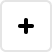
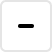
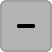
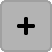
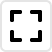
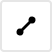
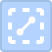
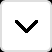
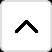
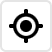

In [1]:
import numpy as np
from PIL import Image
from osgeo import gdal

from lets_plot import *
from lets_plot.geo_data import *
LetsPlot.setup_html()

In [2]:
# Data from geocoding
states = geocode_states().scope("Gabon").inc_res(4).get_boundaries()
cities = geocode_cities().scope("Gabon").get_centroids()

In [3]:
# Data from DEM
dataset = gdal.Open("ivindo/river.bil")
dataset_array = dataset.ReadAsArray()
transform = dataset.GetGeoTransform()
lon_min = transform[0]
lon_max = lon_min + (transform[1] * dataset_array.shape[1])
lat_max = transform[3]
lat_min = lat_max + (transform[5] * dataset_array.shape[0])

In [4]:
# Data from image
image_array = np.asarray(Image.open("osm_ivindo_screen.png"))


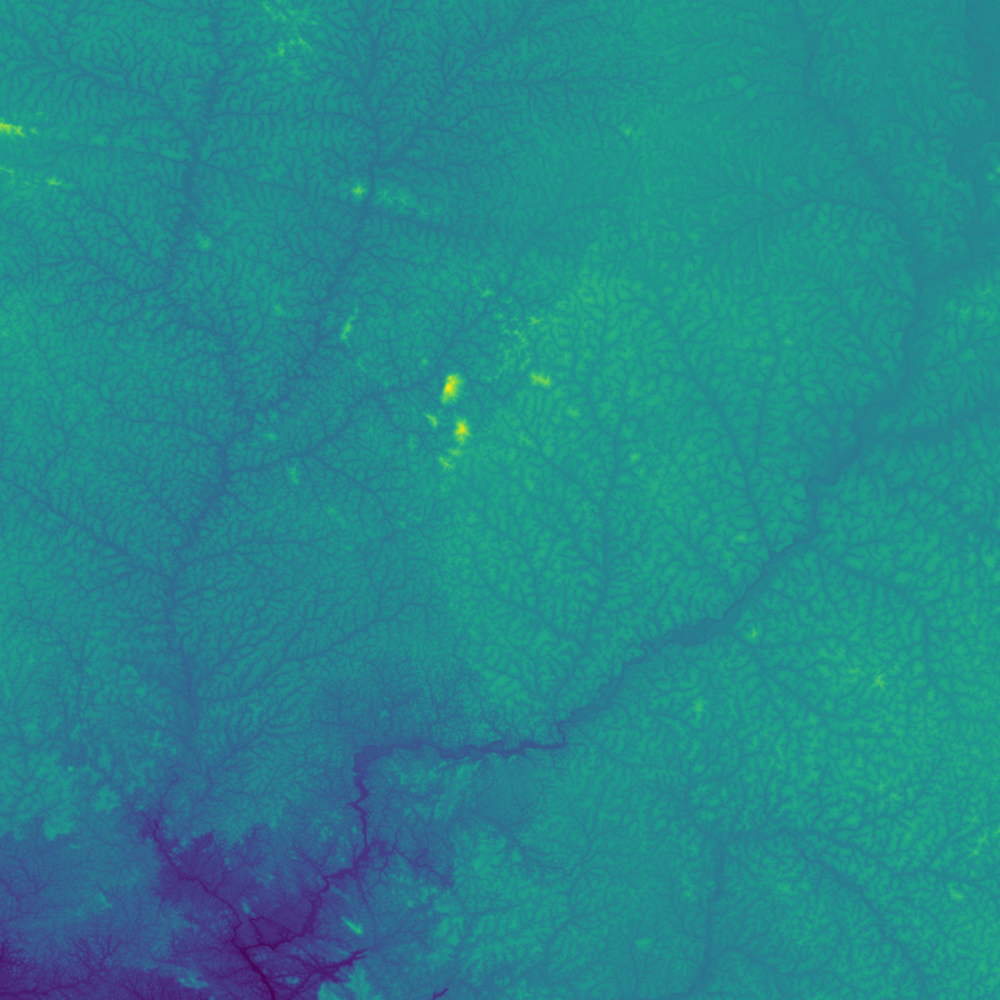
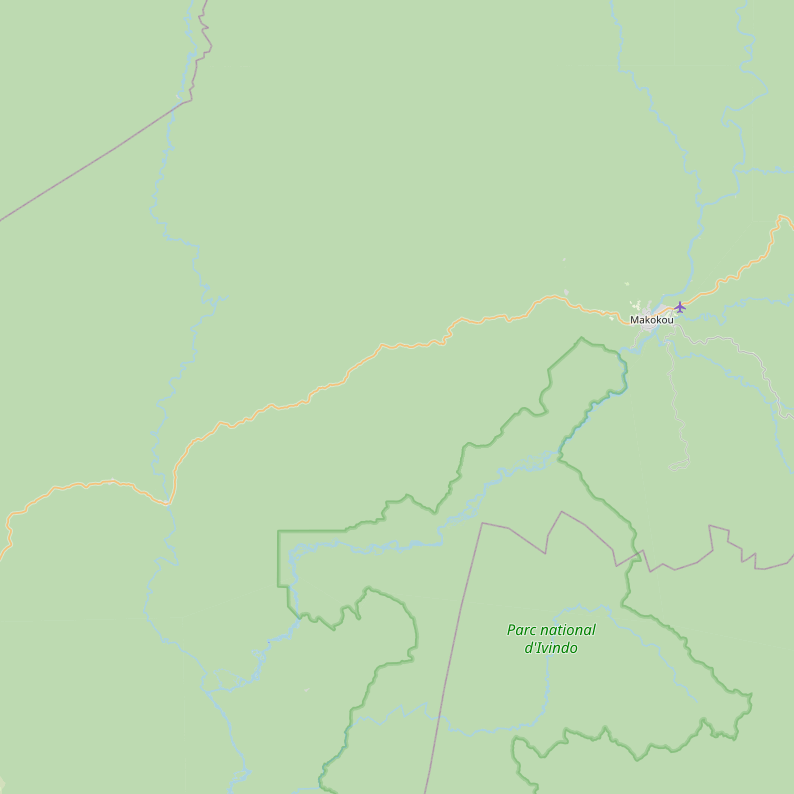

In [5]:
size = 500

plot = ggplot() + \
    geom_imshow(dataset_array, extent=[lon_min, lon_max, lat_min, lat_max], cmap="viridis") + \
    geom_map(data=states, use_crs=states.crs, color="black", alpha=0) + \
    geom_point(data=cities, use_crs=cities.crs, shape=21, size=5, color="black", fill="white") + \
    geom_label(aes(label="found name"), data=cities, use_crs=cities.crs, \
               position=position_nudge(y=.05), fill="white") + \
    coord_map(xlim=[lon_min, lon_max], ylim=[lat_min, lat_max]) + \
    ggtitle("Ivindo river in Gabon (plot)") + \
    theme_classic() + theme(axis="blank")
image = ggplot() + \
    geom_imshow(image_array) + \
    ggtitle("Ivindo river in Gabon (image)") + \
    ggsize(size, size) + \
    theme_classic() + theme(axis="blank")

bunch = GGBunch()
bunch.add_plot(plot, 0, 0, size, size)
bunch.add_plot(image, size, 0, size, size)
bunch.show()